In [1]:
import cogsworth
import astropy.units as u
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import gala.dynamics as gd

In [2]:
%config InlineBackend.figure_format = 'retina'
plt.style.use("default")


pd.options.display.max_columns = 999

plt.rc('font', family='serif')
plt.rcParams['text.usetex'] = False
fs = 24

# update various fontsizes to match
params = {'figure.figsize': (12, 8),
          'legend.fontsize': fs,
          'axes.labelsize': fs,
          'xtick.labelsize': 0.9 * fs,
          'ytick.labelsize': 0.9 * fs,
          'axes.linewidth': 1.1,
          'xtick.major.size': 7,
          'xtick.minor.size': 4,
          'ytick.major.size': 7,
          'ytick.minor.size': 4}
plt.rcParams.update(params)

In [52]:
pd.read_hdf("nans.h5", key="bpp")["bin_num"].unique()

array([  47962,   49635,   65739,   92518,  100332,  147123,  175810,
        229868,  238276,  248392,  314743,  322334,  360924,  372237,
        384016,  386167,  414316,  431852,  432747,  453238,  455075,
        473932,  478462,  479546,  484180,  503534,  515076,  521675,
        526946,  540826,  565396,  566685,  568280,  576171,  660605,
        671433,  689896,  690763,  700288,  727470,  745518,  756191,
        766379,  768926,  812292,  812333,  830569,  873328,  918582,
        961728,  973326,  987382, 1024295, 1024370, 1026454, 1034897,
       1037000, 1037336, 1037698, 1063936, 1119007])

# Load this gargantuan population

~12min to load

In [32]:
pops = [cogsworth.pop.load(f"/mnt/home/twagg/ceph/pops/boundedness/alpha_{alpha}") for alpha in [0.1, 1.0, 2.0, 10.0]]

In [3]:
pops = [None, None, None, None]
pops[1] = cogsworth.pop.load("/mnt/home/twagg/ceph/pops/boundedness/alpha_1.0")

In [4]:
pops[0] = cogsworth.pop.load("/mnt/home/twagg/ceph/pops/boundedness/alpha_0.1")

~3:30 to get

In [41]:
for p, alpha in zip(pops, [0.1, 1.0, 2.0, 10.0]):
    p.alpha = alpha

In [38]:
for p in pops:
    print(p.final_coords)

(<SkyCoord (Galactocentric: galcen_coord=<ICRS Coordinate: (ra, dec) in deg
    (266.4051, -28.936175)>, galcen_distance=8.122 kpc, galcen_v_sun=(12.9, 245.6, 7.78) km / s, z_sun=20.8 pc, roll=0.0 deg): (x, y, z) in kpc
    [(10.86870093, -1.9235262 , 0.81180817),
     (10.8681567 , -1.92229814, 0.81076418),
     (10.86737168, -1.92328562, 0.81120879), ...,
     (-6.39081533, -4.83787241, 0.3539488 ),
     (-6.44431078, -4.87352409, 0.36405695),
     (-6.43566976, -4.81337901, 0.36462372)]
 (v_x, v_y, v_z) in km / s
    [(18.97544321,  83.27577421, 52.34715485),
     (17.97128548,  84.30149331, 51.14185901),
     (18.31677838,  84.46923881, 50.49614229), ...,
     (41.81110386, -95.61262848, 15.17133523),
     (40.9054988 , -96.18648819, 15.28521452),
     (41.12315008, -95.38222017, 15.27458642)]>, <SkyCoord (Galactocentric: galcen_coord=<ICRS Coordinate: (ra, dec) in deg
    (266.4051, -28.936175)>, galcen_distance=8.122 kpc, galcen_v_sun=(12.9, 245.6, 7.78) km / s, z_sun=20.8 pc, ro

In [5]:
f'Total mass of sim: {(p.mass_binaries + p.mass_singles) * u.Msun:1.3e}'

'Total mass of sim: 1.017e+08 solMass'

# Prep star particles

In [23]:
star_particles = pd.read_hdf("FIRE_star_particles.h5")
try:
    particle_orbits = np.load("particle_orbits.npy", allow_pickle=True)
except:
    particle_orbits = [None for _ in range(len(star_particles))]
    for i in range(len(star_particles)):
        if i % 1000 == 0:
            print(i)
        w0 = gd.PhaseSpacePosition(pos=star_particles.iloc[i][["x", "y", "z"]].values * u.kpc,
                                vel=star_particles.iloc[i][["v_x", "v_y", "v_z"]].values * u.km / u.s)
        min_dt = (p.max_ev_time - star_particles.iloc[i]["t_form"] * u.Gyr).to(u.Myr).value
        if min_dt <= 0.01:
            continue
        particle_orbits[i] = p.galactic_potential.integrate_orbit(w0,
                                                                  t1=star_particles.iloc[i]["t_form"] * u.Gyr,
                                                                  t2=p.max_ev_time,
                                                                  dt=min(min_dt - 0.01, 1) * u.Myr)
    np.save("particle_orbits.npy", particle_orbits)

# Cluster size over time

In [24]:
def get_cluster_radii_over_time(p, particle_id):
    # mask population to get just one start particle
    particle_bin_nums = p.initC[p.initC["particle_id"] == particle_id]["bin_num"].values
    p_osp = p[particle_bin_nums]
    
    # track the central orbit of the trace star particle
    centre_orbit = particle_orbits[particle_id]

    positions = np.zeros((len(p_osp) + p_osp.disrupted.sum(), 3, len(centre_orbit.t)))
    masses = np.zeros((len(p_osp) + p_osp.disrupted.sum(), len(centre_orbit.t)))

    # step through each binary
    i = 0
    for bin_num, orbit in zip(p_osp.bin_nums, p_osp.orbits):
        # get the masses of the constituents over time
        x = p_osp.bpp.loc[bin_num][["tphys", "mass_1", "mass_2"]].drop_duplicates(subset="tphys", keep="last")
        times = (centre_orbit.t - centre_orbit.t[0]).to(u.Myr).value

        # for a disrupted system
        if isinstance(orbit, list):
            # track both positions
            positions[i] = orbit[0].pos.xyz.to(u.pc).value
            positions[i + 1] = orbit[1].pos.xyz.to(u.pc).value

            # step through the evolution table
            cursor = 0
            for j in range(len(x) - 1):
                n_in_range = ((times >= x.iloc[j]["tphys"]) & (times < x.iloc[j + 1]["tphys"])).sum()
                # create coarse grained mass arrays
                masses[i, cursor:cursor + n_in_range] = np.repeat(x.iloc[j]["mass_1"], n_in_range)
                masses[i + 1, cursor:cursor + n_in_range] = np.repeat(x.iloc[j]["mass_2"], n_in_range)
                cursor += n_in_range
                
            # advance i twice since primary and secondary
            i += 2
            
        # otherwise we have a bound system
        else:
            positions[i] = orbit.pos.xyz.to(u.pc).value

            # same as above but track the *total* mass now
            cursor = 0
            for j in range(len(x) - 1):
                n_in_range = ((times >= x.iloc[j]["tphys"]) & (times < x.iloc[j + 1]["tphys"])).sum()
                masses[i, cursor:cursor + n_in_range] = np.repeat(x.iloc[j]["mass_1"] + x.iloc[j]["mass_2"],
                                                                  n_in_range)
                cursor += n_in_range

            i += 1

    # get the radii at each timestep
    radii = np.sum((positions - centre_orbit.pos.xyz.to(u.pc).value[None, :, :])**2, axis=1)**(0.5)

    # track the overall radius of the cluster
    cluster_radii = np.zeros(len(centre_orbit.t))
    
    # sort each timestep of particles by their radius
    order = np.argsort(radii, axis=0)

    for i in range(len(radii[0])):
        order = np.argsort(radii[:, i])
        
        # calculate the cumulative mass
        cumulative_mass = np.cumsum(masses[:, i][order])
        cumulative_mass /= cumulative_mass[-1]
        
        # log the radius at which half of the mass is accumulated
        cluster_radii[i] = radii[:, i][order][cumulative_mass > 0.5][0]
    cluster_radii *= u.pc

    return centre_orbit.t - centre_orbit.t[0], cluster_radii

In [26]:
oldish_particles = ((pops[1].max_ev_time.to(u.Gyr).value - star_particles["t_form"].values) * 1000) > 120
oldish_ids = star_particles[oldish_particles].index.values

9142
8684
5545
	Apocenter:  [28.76774257] Myr
	Pericenter:  [] Myr
4234
	Apocenter:  [73.97155973] Myr
	Pericenter:  [] Myr
6972
	Apocenter:  [25.70055902] Myr
	Pericenter:  [] Myr
5588
369
	Apocenter:  [107.63388039] Myr
	Pericenter:  [20.99766507] Myr
8943
	Apocenter:  [19.01407012] Myr
	Pericenter:  [117.83672725] Myr
3564
	Apocenter:  [5.34519049] Myr
	Pericenter:  [112.37656392] Myr
3910
1158
3342
	Apocenter:  [15.61907706] Myr
	Pericenter:  [98.69675631] Myr
2714
3843
	Apocenter:  [6.44915841] Myr
	Pericenter:  [118.49523299] Myr
8429
6766
2818
	Apocenter:  [94.4053447] Myr
	Pericenter:  [8.93203416] Myr
7747
1841
8760
2515
9266
9214
	Apocenter:  [137.57765864] Myr
	Pericenter:  [] Myr
9348
9379
	Apocenter:  [32.05236059] Myr
	Pericenter:  [] Myr


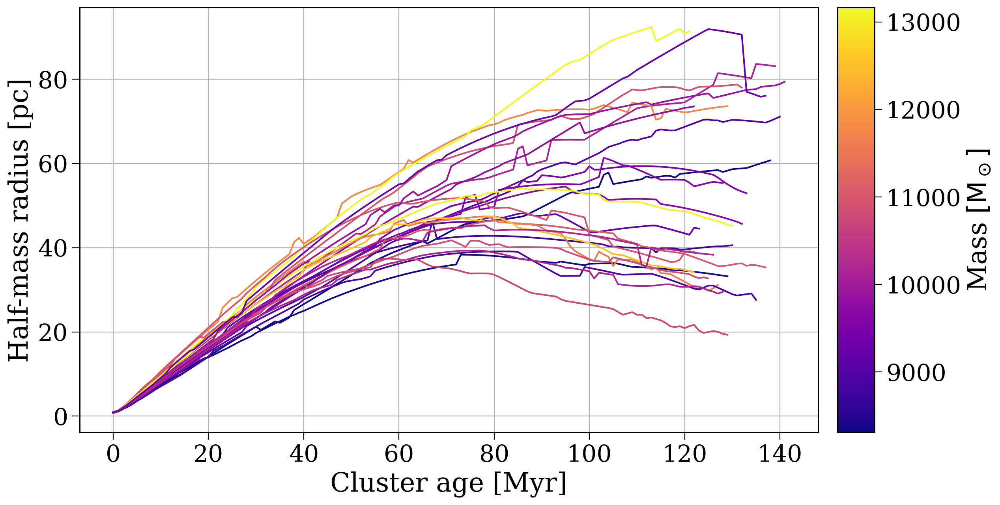

9142
8684
5545
	Apocenter:  [28.76774257] Myr
	Pericenter:  [] Myr
4234
	Apocenter:  [73.97155973] Myr
	Pericenter:  [] Myr
6972
	Apocenter:  [25.70055902] Myr
	Pericenter:  [] Myr
5588
369
	Apocenter:  [107.63388039] Myr
	Pericenter:  [20.99766507] Myr
8943
	Apocenter:  [19.01407012] Myr
	Pericenter:  [117.83672725] Myr
3564
	Apocenter:  [5.34519049] Myr
	Pericenter:  [112.37656392] Myr
3910
1158
3342
	Apocenter:  [15.61907706] Myr
	Pericenter:  [98.69675631] Myr
2714
3843
	Apocenter:  [6.44915841] Myr
	Pericenter:  [118.49523299] Myr
8429
6766
2818
	Apocenter:  [94.4053447] Myr
	Pericenter:  [8.93203416] Myr
7747
1841
8760
2515
9266
9214
	Apocenter:  [137.57765864] Myr
	Pericenter:  [] Myr
9348
9379
	Apocenter:  [32.05236059] Myr
	Pericenter:  [] Myr


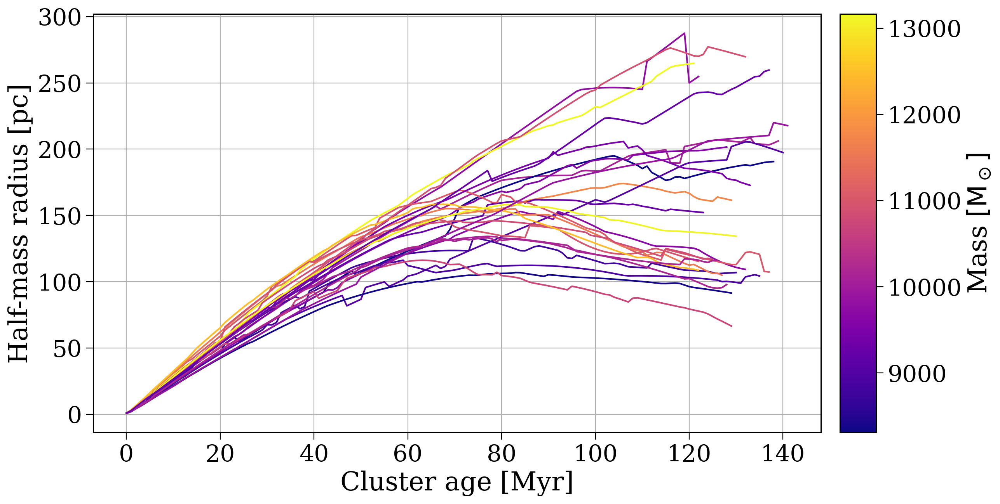

CPU times: user 47.8 s, sys: 742 ms, total: 48.5 s
Wall time: 48.1 s


In [28]:
%%time

n_lines = 25
inds = np.random.choice(oldish_ids, size=n_lines, replace=False)

colour_by = "mass"
cs = star_particles.loc[inds][colour_by]
# cs = np.log10(np.abs(cs))

cmin, cmax = cs.min(), cs.max()
adjusted_cs = (cs - cmin) / (cmax - cmin)

cmap = mpl.cm.plasma

for p in pops[:2]:
    fig, axes = plt.subplots(1, 2, figsize=(13, 7), gridspec_kw={"width_ratios": [20, 1]})
    fig.subplots_adjust(wspace=0.05)

    ax, cbar_ax = axes
    for ind, c in zip(inds, adjusted_cs):
        apocenter_time = particle_orbits[ind].apocenter(return_times=True, func=None)[1]
        pericenter_time = particle_orbits[ind].pericenter(return_times=True, func=None)[1]
        print(ind)
        if len(apocenter_time) > 0:
            print('\tApocenter: ', apocenter_time - particle_orbits[ind].t[0])
        if len(apocenter_time) > 0:
            print('\tPericenter: ', pericenter_time - particle_orbits[ind].t[0])
        ax.plot(*get_cluster_radii_over_time(p, ind), c=cmap(c))

    norm = mpl.colors.Normalize(vmin=cmin, vmax=cmax)
    cbar = mpl.colorbar.ColorbarBase(cbar_ax, cmap=cmap, norm=norm, label=r"Mass $[\rm M_\odot]$")

    ax.set(xlabel="Cluster age [Myr]", ylabel="Half-mass radius [pc]")
    ax.grid()

    plt.show()

# Scale heights

## All types across $\alpha_{\rm vir}$

### Cumulative

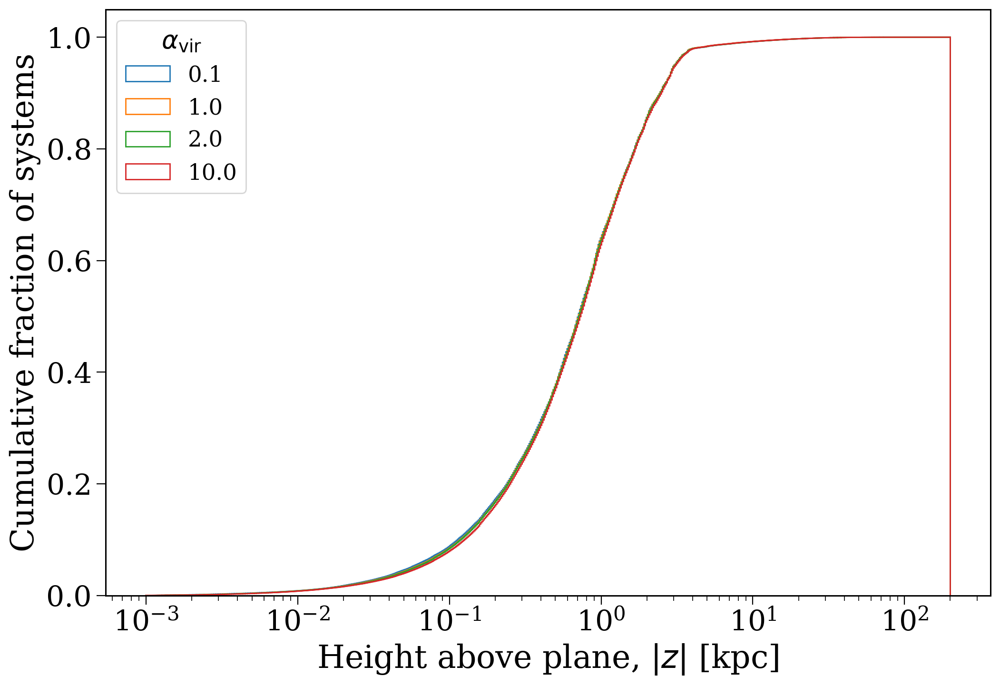

In [100]:
fig, ax = plt.subplots()

for p in pops:
    abs_z = np.concatenate([p.final_coords[0].z.to(u.kpc).value, p.final_coords[1][p.disrupted].z.to(u.kpc).value])
    ax.hist(abs_z, bins=np.geomspace(1e-3, 2e2, 700), histtype="step", label=p.alpha, cumulative=True, density=True)

leg = ax.legend(title=r"$\alpha_{\rm vir}$", fontsize=0.7*fs)
leg.get_title().set_fontsize(0.8*fs)

ax.set(xlabel=r"Height above plane, $|z|$ [kpc]", ylabel=r"Cumulative fraction of systems", xscale="log")

plt.show()

### Histograms

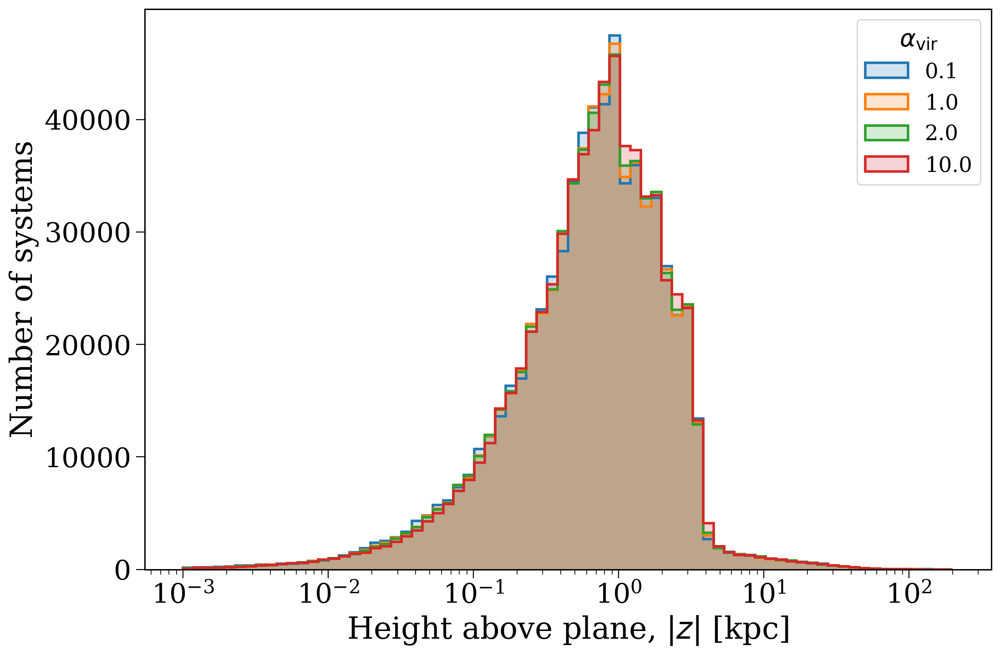

In [99]:
fig, ax = plt.subplots()

for i, p in enumerate(pops):
    abs_z = np.concatenate([p.final_coords[0].z.to(u.kpc).value, p.final_coords[1][p.disrupted].z.to(u.kpc).value])
    ax.hist(abs_z, bins=np.geomspace(1e-3, 2e2, 75), label=p.alpha, lw=2, alpha=0.2, color=f"C{i}")
    ax.hist(abs_z, bins=np.geomspace(1e-3, 2e2, 75), histtype="step", lw=2, color=f"C{i}")

handles, labels = ax.get_legend_handles_labels()
for i in range(len(handles)):
    fc = handles[i].get_facecolor()
    new_fc = (*fc[:3], 0.2)
    handles[i].set_alpha(None)
    handles[i].set_facecolor(new_fc)
    handles[i].set_edgecolor(f"C{i}")
leg = ax.legend(handles=handles, labels=labels, title=r"$\alpha_{\rm vir}$", fontsize=0.7*fs)
leg.get_title().set_fontsize(0.8*fs)

ax.set(xlabel=r"Height above plane, $|z|$ [kpc]", ylabel=r"Number of systems", xscale="log")

plt.show()

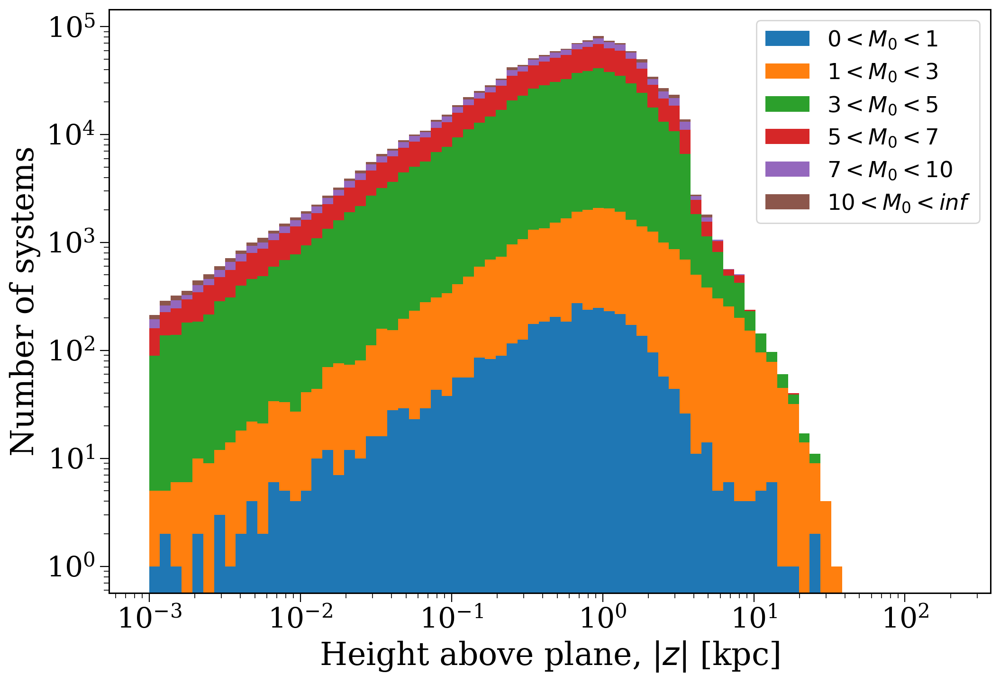

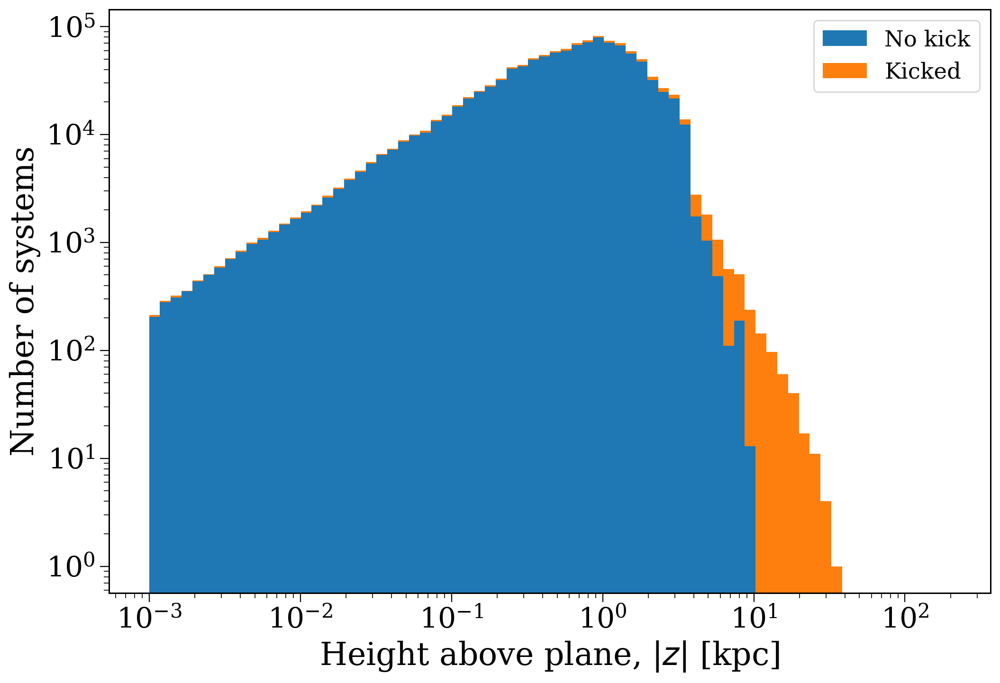

In [21]:
p = pops[1]

primary_is_star = p.final_bpp["kstar_1"] < 13
secondary_is_star = p.final_bpp["kstar_2"] < 13

shiny_masks = [np.where(p.disrupted, primary_is_star, primary_is_star | secondary_is_star), secondary_is_star]

abs_z_shiny_all = np.abs(np.concatenate([p.final_coords[0][shiny_masks[0]].z.to(u.kpc).value,
                                         p.final_coords[1][p.disrupted][shiny_masks[1][p.disrupted]].z.to(u.kpc).value]))
abs_z_dark_all = np.abs(np.concatenate([p.final_coords[0][~shiny_masks[0]].z.to(u.kpc).value,
                                        p.final_coords[1][p.disrupted][~shiny_masks[1][p.disrupted]].z.to(u.kpc).value]))

# fig, ax = plt.subplots()

# ax.hist([abs_z_shiny_all, abs_z_dark_all], bins=np.geomspace(1e-3, 2e2, 75), histtype="bar", lw=2, stacked=True,
#         color=["#dbbe16", "#333"], label=["Shiny", "Only NS/BH"], log=True)

# ax.set(xlabel=r"Height above plane, $|z|$ [kpc]", ylabel=r"Number of systems", xscale="log")
# ax.legend(fontsize=0.7*fs)

# plt.show()

fig, ax = plt.subplots()

abs_z_shinys = []

mass_ranges = [(0, 1), (1, 3), (3, 5), (5, 7), (7, 10), (10, np.inf)]
for m_low, m_high in mass_ranges:
    m1_valid = (p.initC["mass_1"] >= m_low) & (p.initC["mass_1"] < m_high)
    m2_valid = (p.initC["mass_2"] >= m_low) & (p.initC["mass_2"] < m_high)

    mask_1 = ~p.disrupted & ((primary_is_star & m1_valid) | (secondary_is_star & m2_valid & ~primary_is_star))
    mask_2 = p.disrupted & ((primary_is_star & m1_valid))
    mask_3 = p.disrupted & (secondary_is_star & m2_valid)

    abs_z_shinys.append(np.abs(np.concatenate([p.final_coords[0][mask_1].z.to(u.kpc).value,
                                         p.final_coords[0][mask_2].z.to(u.kpc).value,
                                         p.final_coords[1][mask_3].z.to(u.kpc).value])))

label = [rf'${{{m_low}}} < M_{0} < {{{m_high}}}$' for m_low, m_high in mass_ranges]
ax.hist(abs_z_shinys, bins=np.geomspace(1e-3, 2e2, 75), histtype="bar", lw=2, stacked=True, label=label,
        log=True)

ax.set(xlabel=r"Height above plane, $|z|$ [kpc]", ylabel=r"Number of systems", xscale="log")
ax.legend(fontsize=0.7*fs)

plt.show()

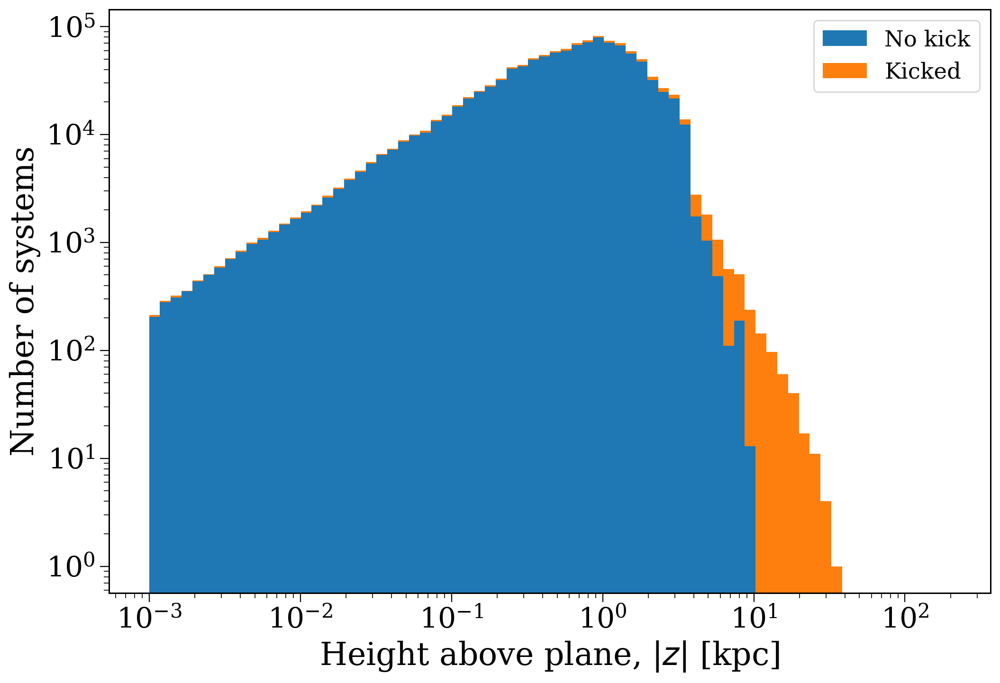

In [22]:
was_kicked = (p.bpp["evol_type"] == 15) | (p.bpp["evol_type"] == 16)
kicked_bin_nums = p.bpp["bin_num"][was_kicked].values
kicked_mask = np.isin(p.bin_nums, kicked_bin_nums)

fig, ax = plt.subplots()

abs_z_shinys = []

for flip in [True, False]:
    mask = ~kicked_mask if flip else kicked_mask

    mask_1 = ~p.disrupted & ((primary_is_star & mask) | (secondary_is_star & mask & ~primary_is_star))
    mask_2 = p.disrupted & ((primary_is_star & mask))
    mask_3 = p.disrupted & (secondary_is_star & mask)

    abs_z_shinys.append(np.abs(np.concatenate([p.final_coords[0][mask_1].z.to(u.kpc).value,
                                         p.final_coords[0][mask_2].z.to(u.kpc).value,
                                         p.final_coords[1][mask_3].z.to(u.kpc).value])))

ax.hist(abs_z_shinys, bins=np.geomspace(1e-3, 2e2, 75), histtype="bar", lw=2, stacked=True,
        log=True, label=["No kick", "Kicked"])

ax.set(xlabel=r"Height above plane, $|z|$ [kpc]", ylabel=r"Number of systems", xscale="log")
ax.legend(fontsize=0.7*fs)

plt.show()

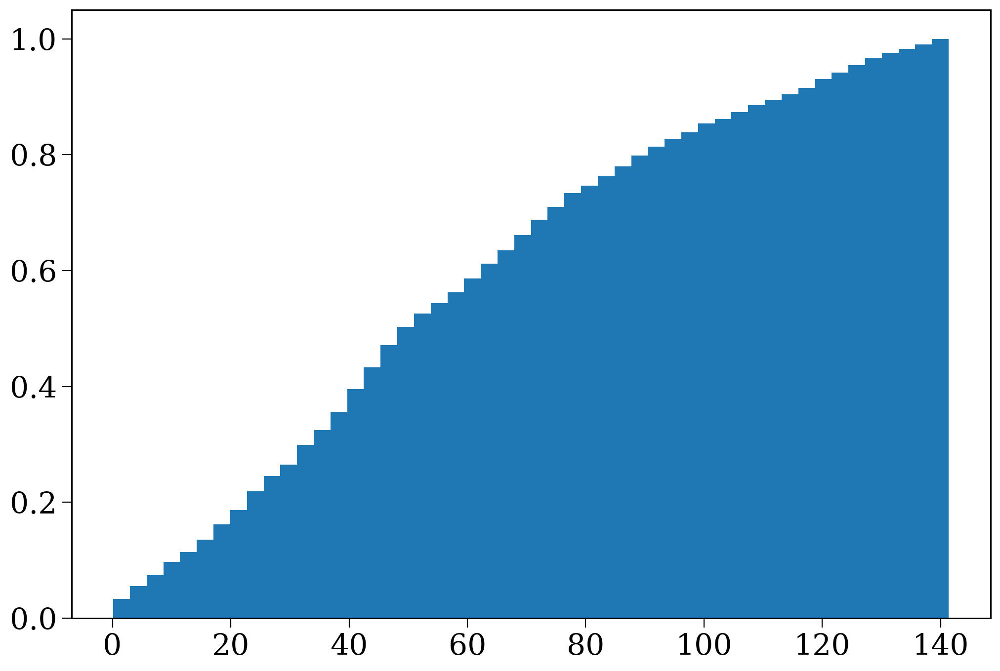

In [50]:
plt.hist(p.final_bpp["tphys"].values, bins=50, cumulative=True, density=True);

184951
182145 0 2806
227012
218659 0 8353
425936
407360 0 18576
122625
117299 0 5326
175821
167208 0 8613
1136345
1136345


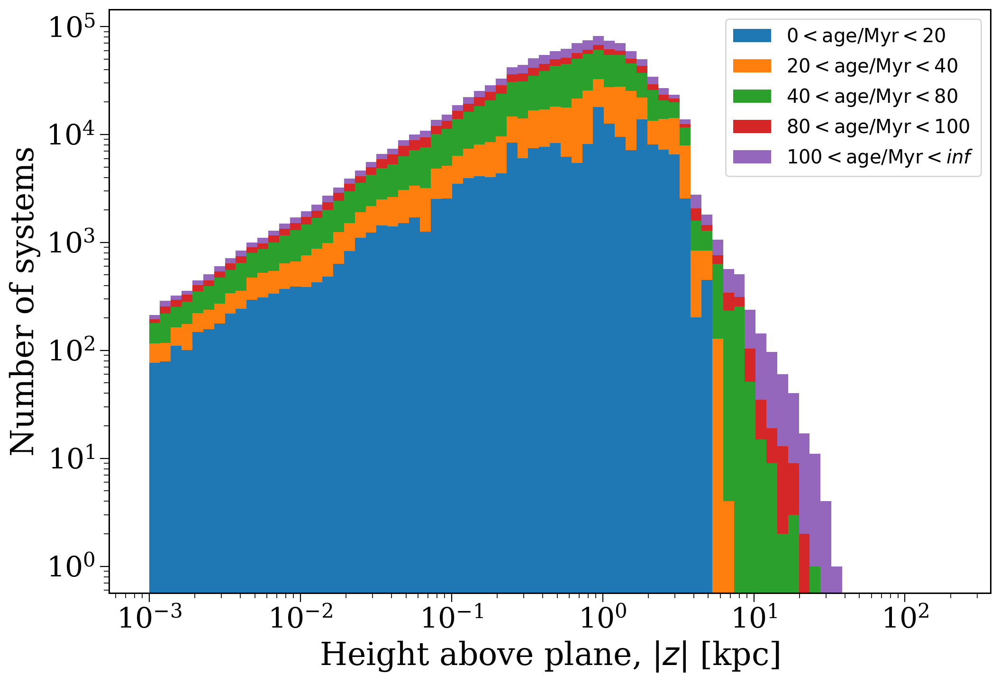

In [58]:
fig, ax = plt.subplots()

abs_z_shinys = []

t_ranges = [(0, 20), (20, 40), (40, 80), (80, 100), (100, np.inf)]
check = 0
for t_low, t_high in t_ranges:
    t_valid = (p.final_bpp["tphys"].values >= t_low) & (p.final_bpp["tphys"].values < t_high)
    print(t_valid.sum())

    mask_1 = ~p.disrupted & ((primary_is_star & t_valid) | (secondary_is_star & t_valid & ~primary_is_star))
    mask_2 = p.disrupted & (primary_is_star & t_valid)
    mask_3 = p.disrupted & (secondary_is_star & t_valid)

    print(mask_1.sum(), mask_2.sum(), mask_3.sum())

    abs_z_shinys.append(np.abs(np.concatenate([p.final_coords[0][mask_1].z.to(u.kpc).value,
                                         p.final_coords[0][mask_2].z.to(u.kpc).value,
                                         p.final_coords[1][mask_3].z.to(u.kpc).value])))
    check += len(abs_z_shinys[-1])

print(check)
print(len(p))

label = [rf'${{{t_low}}} < \mathrm{{age / Myr}} < {{{t_high}}}$' for t_low, t_high in t_ranges]
ax.hist(abs_z_shinys, bins=np.geomspace(1e-3, 2e2, 75), histtype="bar", lw=2, stacked=True, label=label,
        log=True)

ax.set(xlabel=r"Height above plane, $|z|$ [kpc]", ylabel=r"Number of systems", xscale="log")
ax.legend(fontsize=0.6*fs)

plt.show()

# Spatial distributions

## Initial

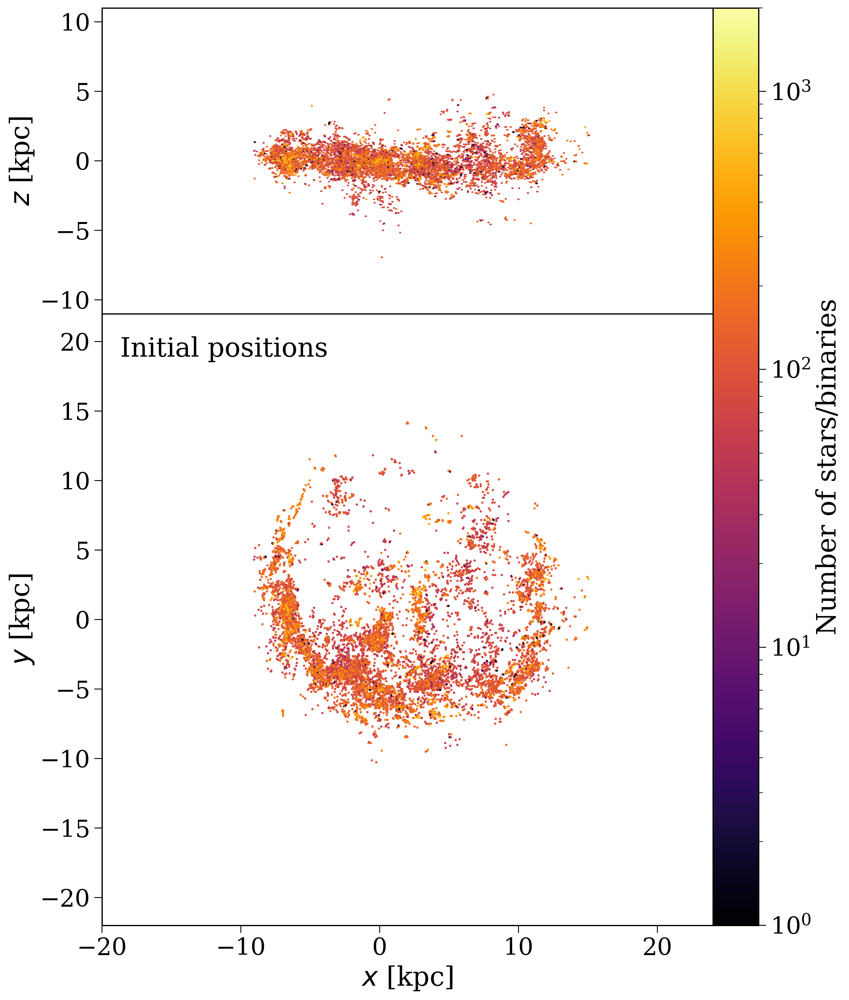

In [7]:
fig, axes = plt.subplots(2, 1, figsize=(14, 15), gridspec_kw={"height_ratios": [1, 2]}, sharex=True)
fig.subplots_adjust(hspace=0)

hexbin = axes[0].hexbin(p.initial_galaxy.positions.x, p.initial_galaxy.positions.z,
                        extent=(-18, 22, -10, 10), bins="log", gridsize=500, cmap="inferno", vmin=1, vmax=2e3)
hexbin = axes[1].hexbin(p.initial_galaxy.positions.x, p.initial_galaxy.positions.y,
                        extent=(-18, 22, -20, 20), bins="log", gridsize=500, cmap="inferno", vmin=1, vmax=2e3)

for ax in axes:
    ax.set_aspect("equal")

fig.colorbar(hexbin, label="Number of stars/binaries", ax=axes, pad=0.0)

axes[0].set_ylabel("$z$ [kpc]")
axes[1].set_xlabel("$x$ [kpc]")
axes[1].set_ylabel("$y$ [kpc]")

axes[1].annotate("Initial positions", xy=(0.03, 0.93), xycoords="axes fraction", fontsize=fs)

plt.show()

## Final

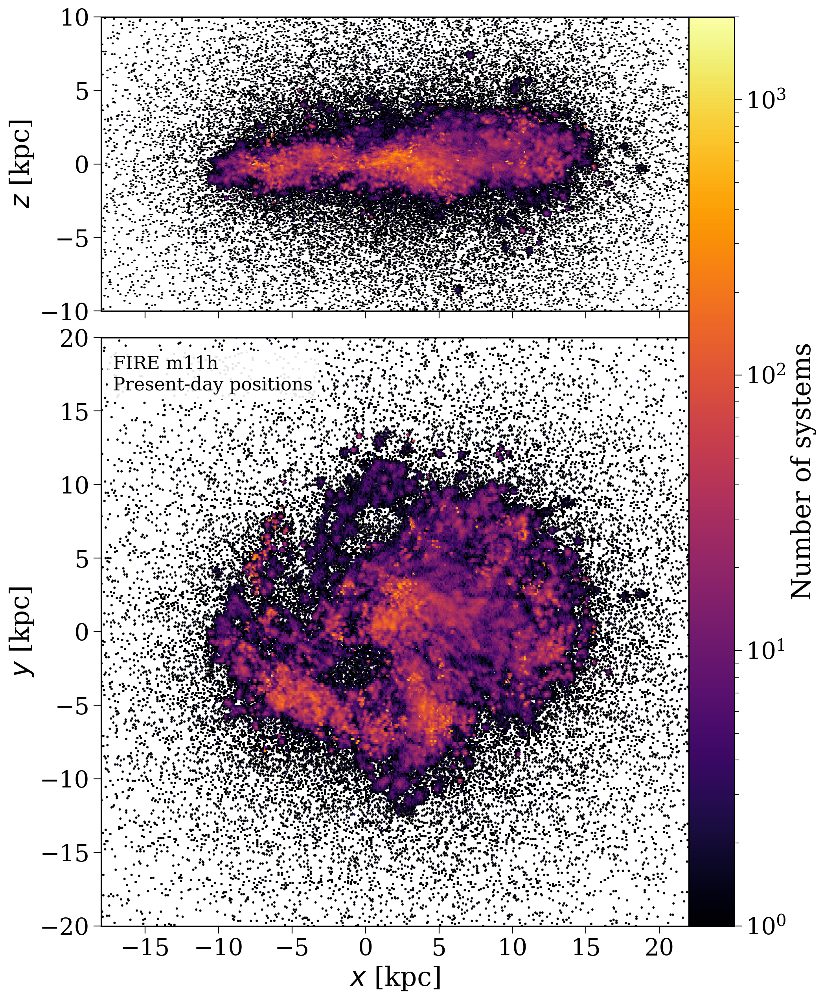

In [69]:

fig, axes = plt.subplots(2, 1, figsize=(14, 15), gridspec_kw={"height_ratios": [1, 2]}, sharex=True)
fig.subplots_adjust(hspace=0.06)

hexbin = axes[0].hexbin(np.concatenate((p.final_coords[0].x.value, p.final_coords[1][p.disrupted].x.value)),
                        np.concatenate((p.final_coords[0].z.value, p.final_coords[1][p.disrupted].z.value)),
                        extent=(-18, 22, -10, 10), bins="log", gridsize=500, cmap="inferno", vmin=1, vmax=2e3,
                        rasterized=True)
hexbin = axes[1].hexbin(np.concatenate((p.final_coords[0].x.value, p.final_coords[1][p.disrupted].x.value)),
                        np.concatenate((p.final_coords[0].y.value, p.final_coords[1][p.disrupted].y.value)),
                        extent=(-18, 22, -20, 20), bins="log", gridsize=500, cmap="inferno", vmin=1, vmax=2e3,
                        rasterized=True)

for ax in axes:
    ax.set_aspect("equal")
    ax.set_xlim(-18, 22)

fig.colorbar(hexbin, label="Number of systems", ax=axes, pad=0.0)

axes[0].set_ylabel("$z$ [kpc]")
axes[1].set_xlabel("$x$ [kpc]")
axes[1].set_ylabel("$y$ [kpc]")

axes[0].set_ylim(-10, 10)
axes[1].set_ylim(-20, 20)

axes[1].annotate("FIRE m11h\nPresent-day positions", xy=(0.02, 0.97), xycoords="axes fraction", fontsize=0.7*fs, bbox=dict(facecolor='white', alpha=0.9, edgecolor="white"), va="top")

plt.savefig("FIRE_final.pdf", format="pdf", bbox_inches="tight", dpi=400)

plt.show()

In [91]:
star_particle_final_coords = np.zeros((len(star_particles), 3)) * u.kpc
for i in range(len(particle_orbits)):
    star_particle_final_coords[i] = particle_orbits[i][-1].xyz

In [92]:
star_particle_final_coords

<Quantity [[10.8838987 , -1.84786104,  0.85736879],
           [10.87456737, -1.84720628,  0.85415893],
           [10.84048435, -1.84369718,  0.86805923],
           ...,
           [ 3.17436939,  7.19848318,  0.95944718],
           [ 3.16119297,  7.34192421,  1.1672379 ],
           [-6.40978951, -4.84734523,  0.34577958]] kpc>

In [89]:
particle_orbits[0][-1].xyz

<Quantity [10.8838987 , -1.84786104,  0.85736879] kpc>

In [163]:
spp = star_particle_final_coords[p.initC[kicked_mask]["particle_id"].values]
kpp = np.transpose([p.final_coords[0][kicked_mask].x, p.final_coords[0][kicked_mask].y, p.final_coords[0][kicked_mask].z]) * u.kpc
kpp_s = np.transpose([p.final_coords[1][kicked_mask].x, p.final_coords[1][kicked_mask].y, p.final_coords[1][kicked_mask].z]) * u.kpc
kicked_distances_primary = np.sum((spp - kpp)**2, axis=1)**(0.5)
kicked_distances_secondary = np.sum((spp - kpp_s)**2, axis=1)**(0.5)

finite_mask = np.isfinite(kicked_distances_secondary)
kicked_distances_secondary = kicked_distances_secondary[finite_mask]

kicked_times = p.final_bpp[kicked_mask]["tphys"].values

In [160]:
spp = star_particle_final_coords[p.initC[~kicked_mask]["particle_id"].values]
upp = np.transpose([p.final_coords[0][~kicked_mask].x, p.final_coords[0][~kicked_mask].y, p.final_coords[0][~kicked_mask].z]) * u.kpc
unkicked_distances = np.sum((spp - upp)**2, axis=1)**(0.5)

unkicked_times = p.final_bpp[~kicked_mask]["tphys"].values

In [156]:
kicked_but_together = np.isin(p.bin_nums[kicked_mask], p.bin_nums[~p.disrupted])

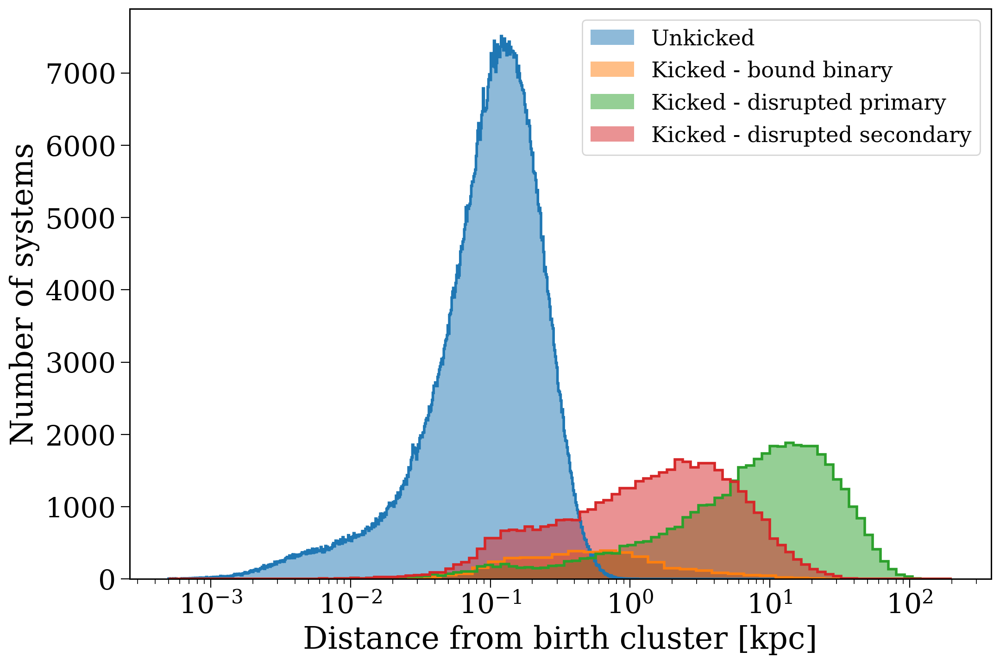

In [195]:
fig, ax = plt.subplots()

i = 0
for arr, label, n_bins in zip([unkicked_distances, kicked_distances_primary[kicked_but_together], kicked_distances_primary[~kicked_but_together], kicked_distances_secondary],
                              ["Unkicked", "Kicked - bound binary", "Kicked - disrupted primary", "Kicked - disrupted secondary"],
                              [1000, 50, 100, 100]):
    ax.hist(arr.value, bins=np.geomspace(5e-4, 2e2, n_bins), lw=2, label=label, alpha=0.5, color=f"C{i}");
    ax.hist(arr.value, bins=np.geomspace(5e-4, 2e2, n_bins), lw=2, histtype="step", color=f"C{i}");
    i += 1

ax.legend(fontsize=0.7*fs)
ax.set_xscale("log")

ax.set_xlabel("Distance from birth cluster [kpc]")
ax.set_ylabel("Number of systems")

plt.show()

## Split by kicks

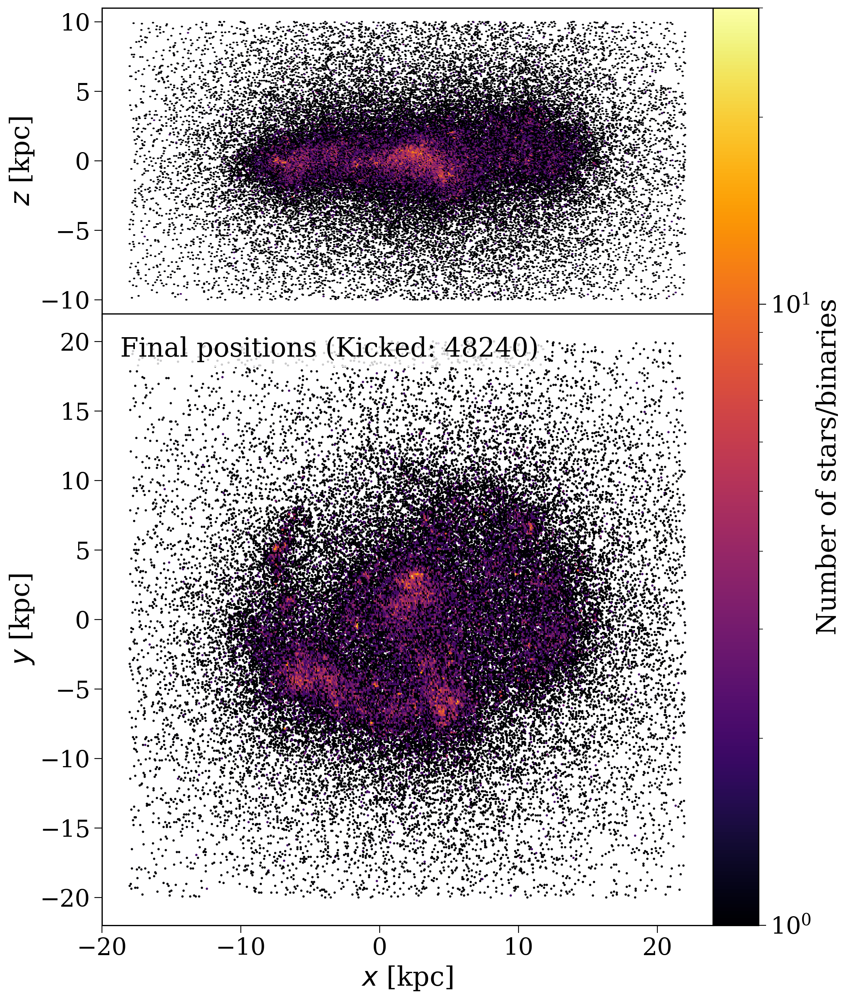

In [40]:

fig, axes = plt.subplots(2, 1, figsize=(14, 15), gridspec_kw={"height_ratios": [1, 2]}, sharex=True)
fig.subplots_adjust(hspace=0)

hexbin = axes[0].hexbin(np.concatenate((p.final_coords[0].x.value[kicked_mask], p.final_coords[1][kicked_mask].x.value)),
                        np.concatenate((p.final_coords[0].z.value[kicked_mask], p.final_coords[1][kicked_mask].z.value)),
                        extent=(-18, 22, -10, 10), bins="log", gridsize=500, cmap="inferno", vmin=1, vmax=3e1)
hexbin = axes[1].hexbin(np.concatenate((p.final_coords[0].x.value[kicked_mask], p.final_coords[1][kicked_mask].x.value)),
                        np.concatenate((p.final_coords[0].y.value[kicked_mask], p.final_coords[1][kicked_mask].y.value)),
                        extent=(-18, 22, -20, 20), bins="log", gridsize=500, cmap="inferno", vmin=1, vmax=3e1)

for ax in axes:
    ax.set_aspect("equal")

fig.colorbar(hexbin, label="Number of stars/binaries", ax=axes, pad=0.0)

axes[0].set_ylabel("$z$ [kpc]")
axes[1].set_xlabel("$x$ [kpc]")
axes[1].set_ylabel("$y$ [kpc]")

axes[1].annotate(f"Final positions (Kicked: {kicked_mask.sum()})", xy=(0.03, 0.93), xycoords="axes fraction", fontsize=fs, bbox=dict(facecolor='white', alpha=0.8, edgecolor="white"))

plt.show()

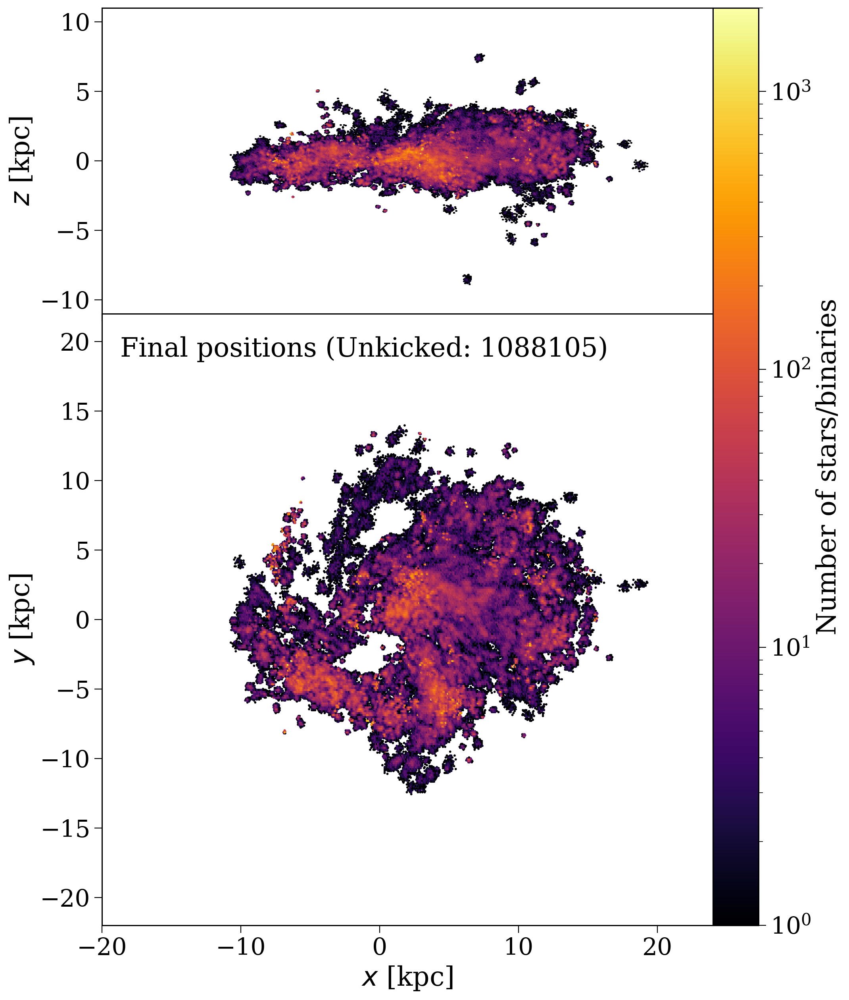

In [12]:

fig, axes = plt.subplots(2, 1, figsize=(14, 15), gridspec_kw={"height_ratios": [1, 2]}, sharex=True)
fig.subplots_adjust(hspace=0)

hexbin = axes[0].hexbin(p.final_coords[0].x.value[~kicked_mask],
                        p.final_coords[0].z.value[~kicked_mask],
                        extent=(-18, 22, -10, 10), bins="log", gridsize=500, cmap="inferno", vmin=1, vmax=2e3)
hexbin = axes[1].hexbin(p.final_coords[0].x.value[~kicked_mask],
                        p.final_coords[0].y.value[~kicked_mask],
                        extent=(-18, 22, -20, 20), bins="log", gridsize=500, cmap="inferno", vmin=1, vmax=2e3)

for ax in axes:
    ax.set_aspect("equal")

fig.colorbar(hexbin, label="Number of stars/binaries", ax=axes, pad=0.0)

axes[0].set_ylabel("$z$ [kpc]")
axes[1].set_xlabel("$x$ [kpc]")
axes[1].set_ylabel("$y$ [kpc]")

axes[1].annotate(f"Final positions (Unkicked: {(~kicked_mask).sum()})", xy=(0.03, 0.93), xycoords="axes fraction", fontsize=fs, bbox=dict(facecolor='white', alpha=0.8, edgecolor="white"))

plt.show()

### Ratios

In [13]:
kicked_x = np.concatenate((p.final_coords[0].x.value[kicked_mask], p.final_coords[1][kicked_mask].x.value))
kicked_y = np.concatenate((p.final_coords[0].y.value[kicked_mask], p.final_coords[1][kicked_mask].y.value))
kicked_z = np.concatenate((p.final_coords[0].z.value[kicked_mask], p.final_coords[1][kicked_mask].z.value))

unkicked_x = p.final_coords[0].x.value[~kicked_mask]
unkicked_y = p.final_coords[0].y.value[~kicked_mask]
unkicked_z = p.final_coords[0].z.value[~kicked_mask]

In [23]:
ratio_bins = 150

H_kicked_z, _, _ = np.histogram2d(kicked_x, kicked_z, bins=ratio_bins, range=[[-18, 22], [-10, 10]])
H_kicked_y, _, _ = np.histogram2d(kicked_x, kicked_y, bins=ratio_bins, range=[[-18, 22], [-20, 20]])

H_unkicked_z, _, _ = np.histogram2d(unkicked_x, unkicked_z, bins=ratio_bins, range=[[-18, 22], [-10, 10]])
H_unkicked_y, _, _ = np.histogram2d(unkicked_x, unkicked_y, bins=ratio_bins, range=[[-18, 22], [-20, 20]])

/tmp/ipykernel_1332098/2240082350.py:4: RuntimeWarning: divide by zero encountered in divide
  im = axes[0].imshow(H_kicked_z / (H_kicked_z + H_unkicked_z).T, origin="lower", extent=[-18, 22, -10, 10], cmap="viridis_r", norm="log", vmin=1e-3, vmax=1e0)
/tmp/ipykernel_1332098/2240082350.py:4: RuntimeWarning: invalid value encountered in divide
  im = axes[0].imshow(H_kicked_z / (H_kicked_z + H_unkicked_z).T, origin="lower", extent=[-18, 22, -10, 10], cmap="viridis_r", norm="log", vmin=1e-3, vmax=1e0)
/tmp/ipykernel_1332098/2240082350.py:5: RuntimeWarning: divide by zero encountered in divide
  im = axes[1].imshow(H_kicked_y / (H_kicked_y + H_unkicked_y).T, origin="lower", extent=[-18, 22, -20, 20], cmap="viridis_r", norm="log", vmin=1e-3, vmax=1e0)
/tmp/ipykernel_1332098/2240082350.py:5: RuntimeWarning: invalid value encountered in divide
  im = axes[1].imshow(H_kicked_y / (H_kicked_y + H_unkicked_y).T, origin="lower", extent=[-18, 22, -20, 20], cmap="viridis_r", norm="log", vmin=1e-3, 

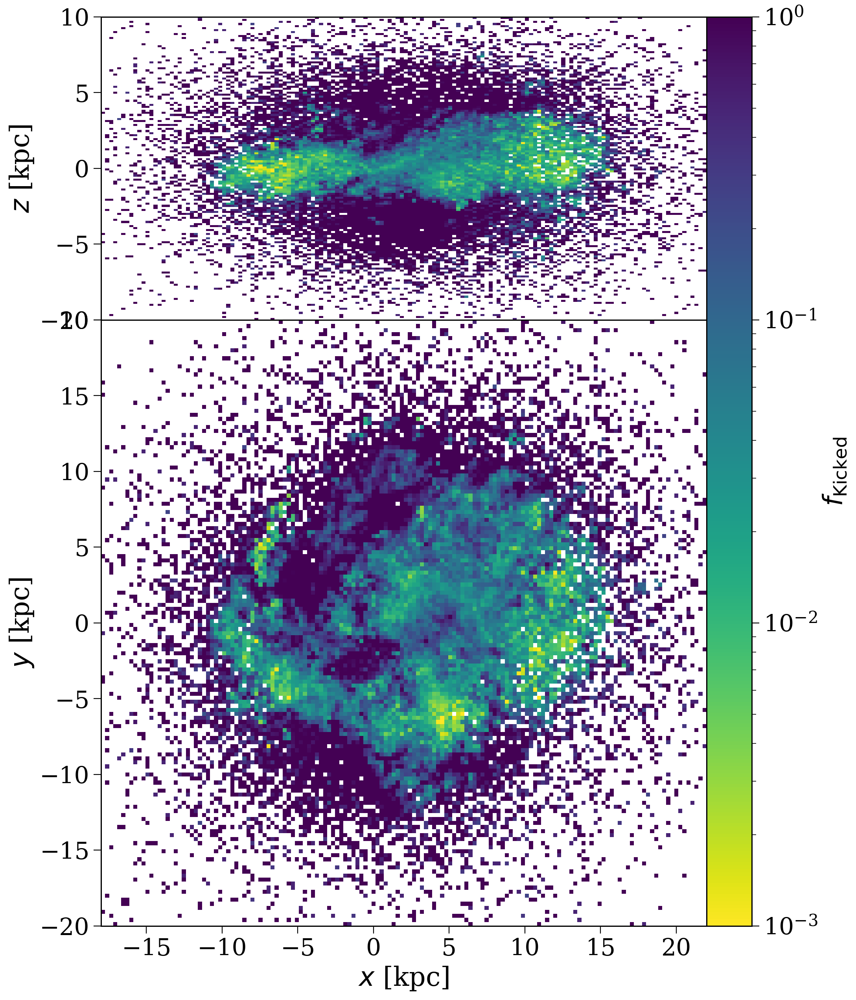

In [38]:
fig, axes = plt.subplots(2, 1, figsize=(14, 15), gridspec_kw={"height_ratios": [1, 2]}, sharex=True)
fig.subplots_adjust(hspace=0)

im = axes[0].imshow(H_kicked_z / (H_kicked_z + H_unkicked_z).T, origin="lower", extent=[-18, 22, -10, 10], cmap="viridis_r", norm="log", vmin=1e-3, vmax=1e0)
im = axes[1].imshow(H_kicked_y / (H_kicked_y + H_unkicked_y).T, origin="lower", extent=[-18, 22, -20, 20], cmap="viridis_r", norm="log", vmin=1e-3, vmax=1e0)
# fig.colorbar(im, label=r"$f_\mathrm{Kicked}$", ax=axes, pad=0.0)
fig.colorbar(im, label=r"Fraction that received a supernova kick", ax=axes, pad=0.0)

for ax in axes:
    ax.set_aspect("equal")
    
axes[0].set_ylabel("$z$ [kpc]")
axes[1].set_xlabel("$x$ [kpc]")
axes[1].set_ylabel("$y$ [kpc]")

plt.show()

# Orbits

In [60]:
def add_stars(ax, starsurfacedensity=0.8, lw=1):
    starcolor = (1.,1.,1.)
    area = np.sqrt(np.sum(np.square(ax.transAxes.transform([1.,1.]) - ax.transAxes.transform([0.,0.]))))*1
    nstars = int(starsurfacedensity*area)

    #small stars
    xy = np.random.uniform(size=(nstars,2))
    ax.scatter(xy[:,0],xy[:,1], transform=ax.transAxes, alpha=0.05, s=8*lw, facecolor=starcolor, edgecolor=None, zorder=3, rasterized=True)
    ax.scatter(xy[:,0],xy[:,1], transform=ax.transAxes, alpha=0.1, s=4*lw, facecolor=starcolor, edgecolor=None, zorder=3, rasterized=True)
    ax.scatter(xy[:,0],xy[:,1], transform=ax.transAxes, alpha=0.2, s=0.5*lw, facecolor=starcolor, edgecolor=None, zorder=3, rasterized=True)

    #large stars
    xy = np.random.uniform(size=(nstars//4,2))
    ax.scatter(xy[:,0],xy[:,1], transform=ax.transAxes, alpha=0.1, s=15*lw, facecolor=starcolor, edgecolor=None, zorder=3, rasterized=True)
    ax.scatter(xy[:,0],xy[:,1], transform=ax.transAxes, alpha=0.1, s=5*lw, facecolor=starcolor, edgecolor=None, zorder=3, rasterized=True)
    ax.scatter(xy[:,0],xy[:,1], transform=ax.transAxes, alpha=0.5, s=2*lw, facecolor=starcolor, edgecolor=None, zorder=3, rasterized=True)

In [61]:
from matplotlib.lines import Line2D
from matplotlib.legend_handler import HandlerLineCollection
from matplotlib.collections import LineCollection

class HandlerColorLineCollection(HandlerLineCollection):
    def create_artists(self, legend, artist ,xdescent, ydescent,
                        width, height, fontsize,trans):
        x = np.linspace(0,width,self.get_numpoints(legend)+1)
        y = np.zeros(self.get_numpoints(legend)+1)+height/2.-ydescent
        points = np.array([x, y]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        lc = LineCollection(segments, cmap=artist.cmap,
                            transform=trans, colors=[f'C{i}' for i in range(self.get_numpoints(legend))])
        lc.set_array(x)
        lc.set_linewidth(artist.get_linewidth())
        return [lc]

In [62]:
cluster_style = {
    "color": "grey",
    "zorder": -1,
    "linestyle": "-",
    "alpha": 0.5,
    "autolim": True,
    "lw": 2,
    "rasterized": True
}
supernova_style = {
    "color": None,
    "zorder": 4,
    "linestyle": "-",
    "alpha": 0.8,
    "autolim": False,
    "lw": 2
}
companion_style = {
    "color": None,
    "zorder": 4,
    "linestyle": "-",
    "alpha": 0.8,
    "autolim": False,
    "lw": 2
}

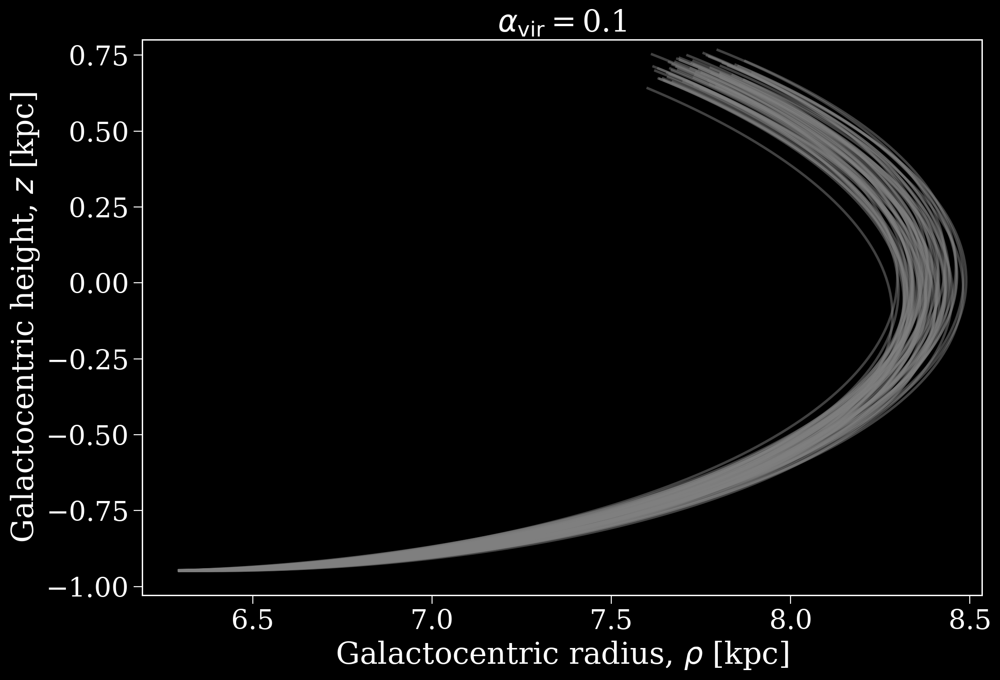

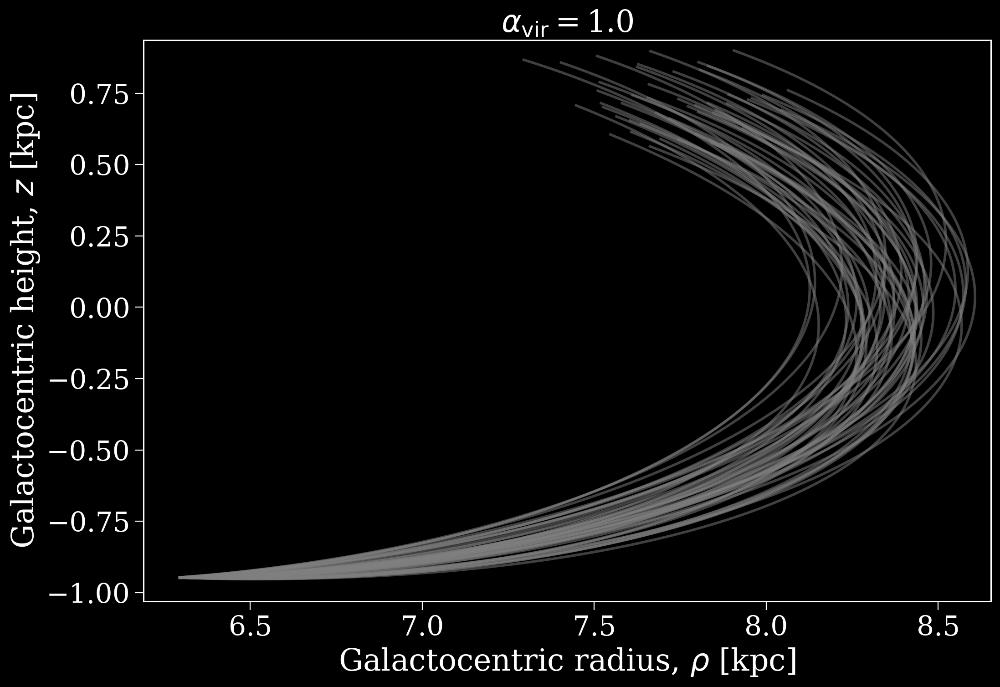

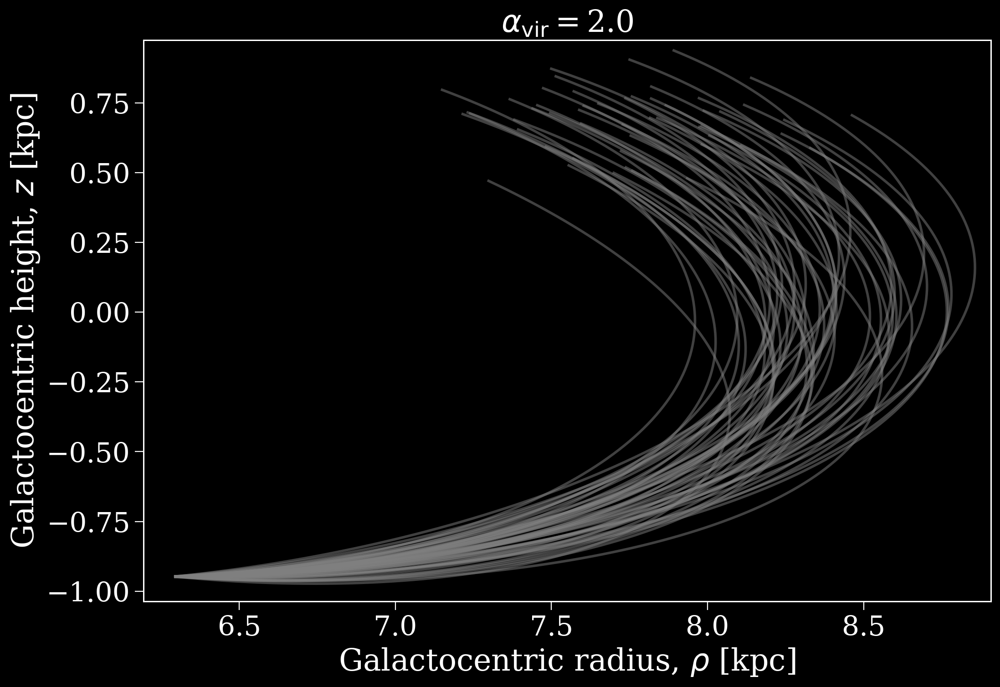

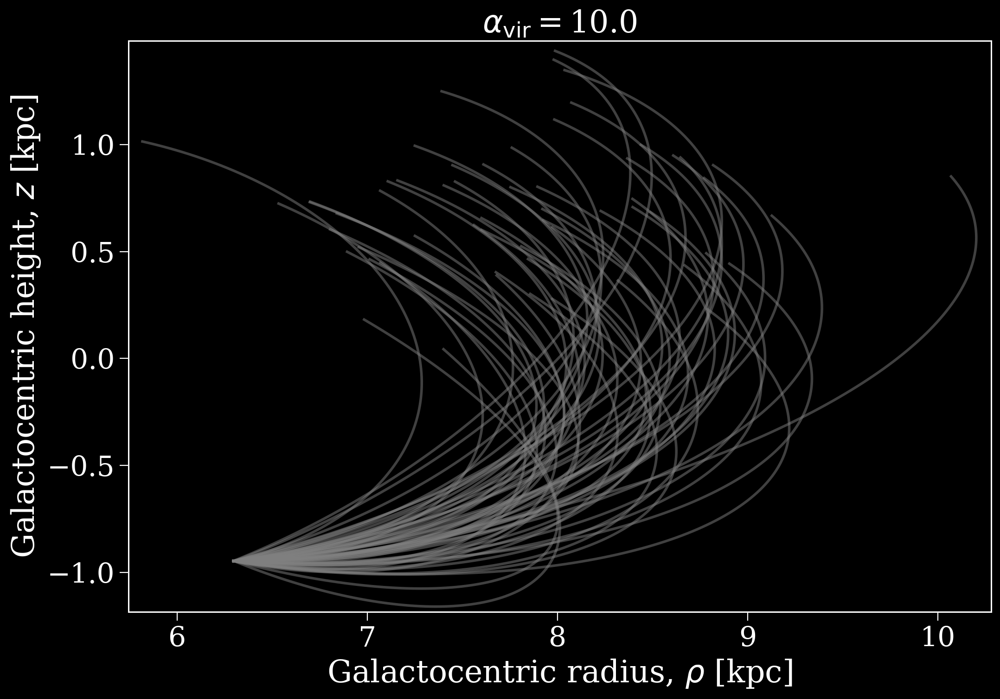

In [113]:
plt.style.use("dark_background")

for p in pops:
    one_particle = (p.initC["particle_id"] == 6000).values
    p_osp = p[one_particle]

    was_kicked = (p.bpp["evol_type"] == 15) | (p.bpp["evol_type"] == 16)
    kicked_bin_nums = p.bpp["bin_num"][was_kicked].values
    kicked_mask = np.isin(p.bin_nums, kicked_bin_nums)

    fig, ax = plt.subplots()

    for bin_num, orbit in zip(p_osp.bin_nums, p_osp.orbits):
        if bin_num in kicked_bin_nums:
            continue
        style = supernova_style if bin_num in kicked_bin_nums else cluster_style

        if isinstance(orbit, list):
            orbit[0].cylindrical.plot(["rho", "z"], axes=ax, **style);

            companion_style["color"] = ax.lines[-1].get_color()
            orbit[1].cylindrical.plot(["rho", "z"], axes=ax, **companion_style);
        
            bpp_rows = p_osp.bpp.loc[bin_num]
            t_SN = bpp_rows[bpp_rows["evol_type"] == 15]["tphys"].values[0]
            ind_SN = np.argmin(np.abs(orbit[0].t - orbit[0].t[0] - t_SN * u.Myr))

            ax.scatter(orbit[0].cylindrical.rho[ind_SN], orbit[0].cylindrical.z[ind_SN], s=150, zorder=5, marker=(12, 2, 0))

        else:
            orbit.cylindrical.plot(["rho", "z"], axes=ax, **style);


    # add_stars(ax, starsurfacedensity=0.5)

    # ax.plot(particle_orbits[6000].cylindrical.rho, particle_orbits[6000].cylindrical.z, color="black", lw=3)

    # ax.set_xlim(0, 20)
    # ax.set_ylim(-10, 10)

    ax.set_xlabel(r"Galactocentric radius, $\rho$ [kpc]")
    ax.set_ylabel(r"Galactocentric height, $z$ [kpc]")
    # ax.set_xlim(right=8.7)

    lc = LineCollection([[[i / 4, 0], [(i + 1) / 4, 0]] for i in range(4)], linewidths=5)

    # ax.legend(handles=[lc,
    #                 Line2D([0], [0], color='grey', lw=4)], labels=["Kicked systems", "Unkicked systems"],
    #                 handler_map={lc: HandlerColorLineCollection(numpoints=4)}, framealpha=1.0, loc="upper left")

    ax.set_title(r"$\alpha_{\rm vir} = $" + str(p.alpha), fontsize=fs)

    # plt.savefig("orbits_example.pdf", format="pdf", bbox_inches="tight")

    plt.show()

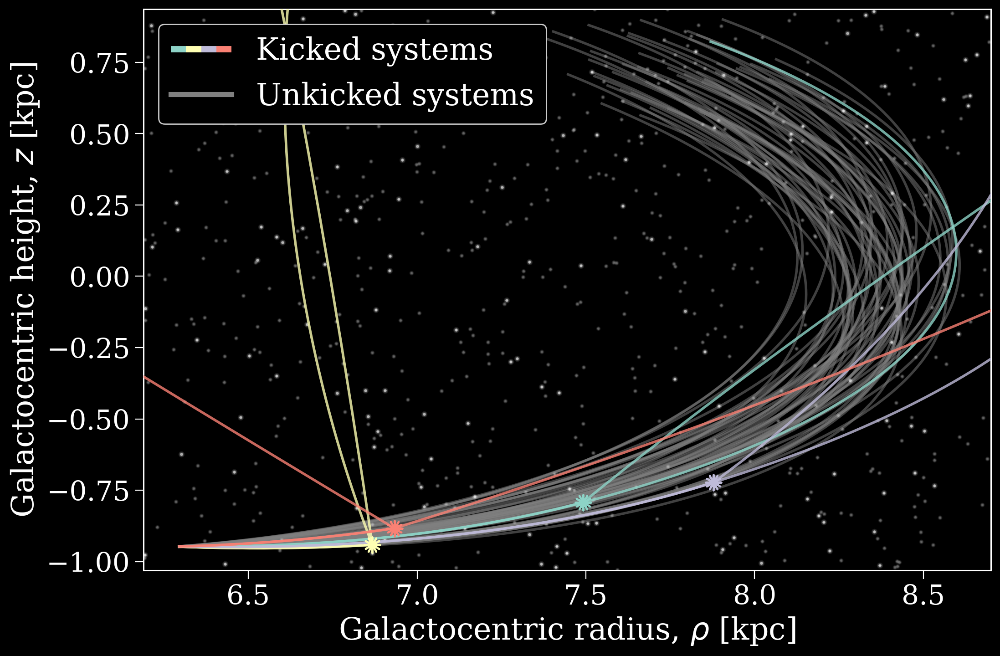

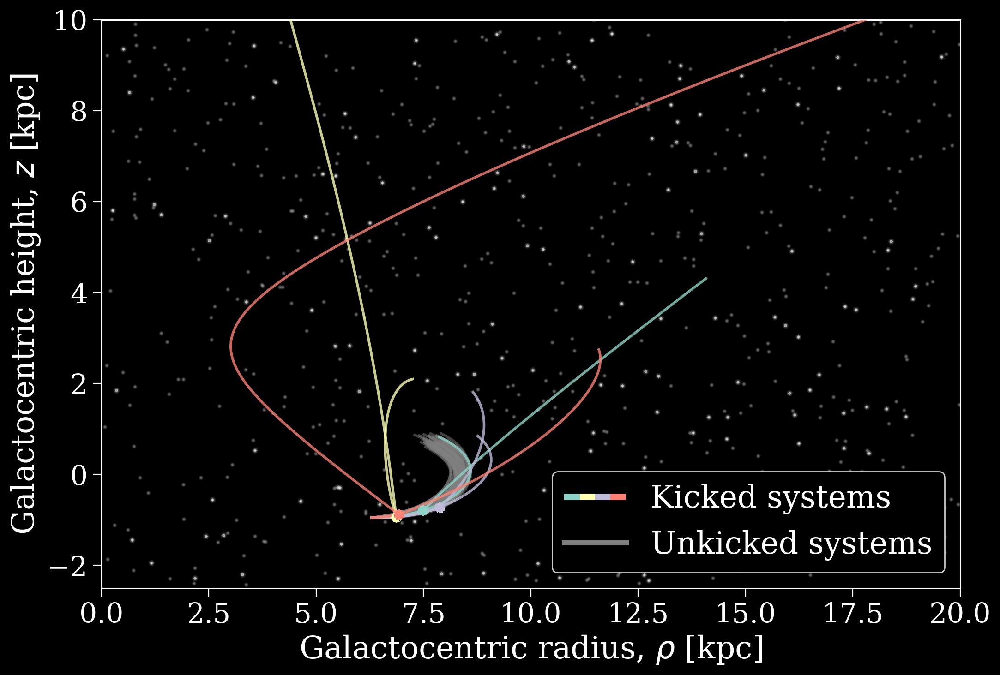

In [49]:
plt.style.use("dark_background")

fig, ax = plt.subplots()
cluster_style = {
    "color": "grey",
    "zorder": -1,
    "linestyle": "-",
    "alpha": 0.5,
    "autolim": True,
    "lw": 2
}
supernova_style = {
    "color": None,
    "zorder": 4,
    "linestyle": "-",
    "alpha": 0.8,
    "autolim": False,
    "lw": 2
}
companion_style = {
    "color": None,
    "zorder": 4,
    "linestyle": "-",
    "alpha": 0.8,
    "autolim": False,
    "lw": 2
}


for bin_num, orbit in zip(p_osp.bin_nums, p_osp.orbits):
    style = supernova_style if bin_num in kicked_bin_nums else cluster_style

    if isinstance(orbit, list):
        orbit[0].cylindrical.plot(["rho", "z"], axes=ax, **style);

        companion_style["color"] = ax.lines[-1].get_color()
        orbit[1].cylindrical.plot(["rho", "z"], axes=ax, **companion_style);
    
        bpp_rows = p_osp.bpp.loc[bin_num]
        t_SN = bpp_rows[bpp_rows["evol_type"] == 15]["tphys"].values[0]
        ind_SN = np.argmin(np.abs(orbit[0].t - orbit[0].t[0] - t_SN * u.Myr))

        ax.scatter(orbit[0].cylindrical.rho[ind_SN], orbit[0].cylindrical.z[ind_SN], s=50, zorder=5, marker=(12, 2, 0))

    else:
        orbit.cylindrical.plot(["rho", "z"], axes=ax, **style);


add_stars(ax, starsurfacedensity=0.5)

# ax.plot(particle_orbits[6000].cylindrical.rho, particle_orbits[6000].cylindrical.z, color="black", lw=3)

ax.set_xlim(0, 20)
ax.set_ylim(-2.5, 10)

ax.set_xlabel(r"Galactocentric radius, $\rho$ [kpc]")
ax.set_ylabel(r"Galactocentric height, $z$ [kpc]")
# ax.set_xlim(right=8.7)

lc = LineCollection([[[i / 4, 0], [(i + 1) / 4, 0]] for i in range(4)], linewidths=5)

ax.legend(handles=[lc,
                   Line2D([0], [0], color='grey', lw=4)], labels=["Kicked systems", "Unkicked systems"],
                   handler_map={lc: HandlerColorLineCollection(numpoints=4)}, framealpha=1.0, loc="lower right")


plt.show()

In [ ]:
sn_rows = p.bpp.loc[kicked_bin_nums][(p.bpp.loc[kicked_bin_nums]["evol_type"] == 15) | (p.bpp.loc[kicked_bin_nums]["evol_type"] == 16)]

In [ ]:
sn_distances = np.zeros(len(kicked_bin_nums)) * u.kpc
child_orbits = p.orbits[kicked_mask]
parent_orbits = particle_orbits[p.initC.loc[kicked_bin_nums]["particle_id"].values]
for i in range(len(kicked_bin_nums)):
    parent_orbit = parent_orbits[i]
    child_orbit = child_orbits[i]
    if isinstance(child_orbit, list):
        child_orbit = child_orbit[0]

    sn_time = sn_rows["tphys"].iloc[i]

    parent_pos = parent_orbit.pos[np.argmin(abs(parent_orbit.t - (sn_time * u.Myr + parent_orbit.t[0])))]
    child_pos = child_orbit.pos[np.argmin(abs(child_orbit.t - (sn_time * u.Myr + child_orbit.t[0])))]

    sn_distances[i] = sum((parent_pos - child_pos).xyz**2)**(0.5)

In [ ]:
sn_distances_hists = [sn_distances[(p.initC.loc[kicked_bin_nums]["mass_1"].values <= 15)], sn_distances[(p.initC.loc[kicked_bin_nums]["mass_1"].values > 15)]]

In [ ]:
star_particles.sort_values("t_form")["mass"].cumsum().values

array([1.11329004e+04, 2.08887978e+04, 2.98696038e+04, ...,
       1.01650008e+08, 1.01662791e+08, 1.01674856e+08])

16265
11154
10571
5873
4377


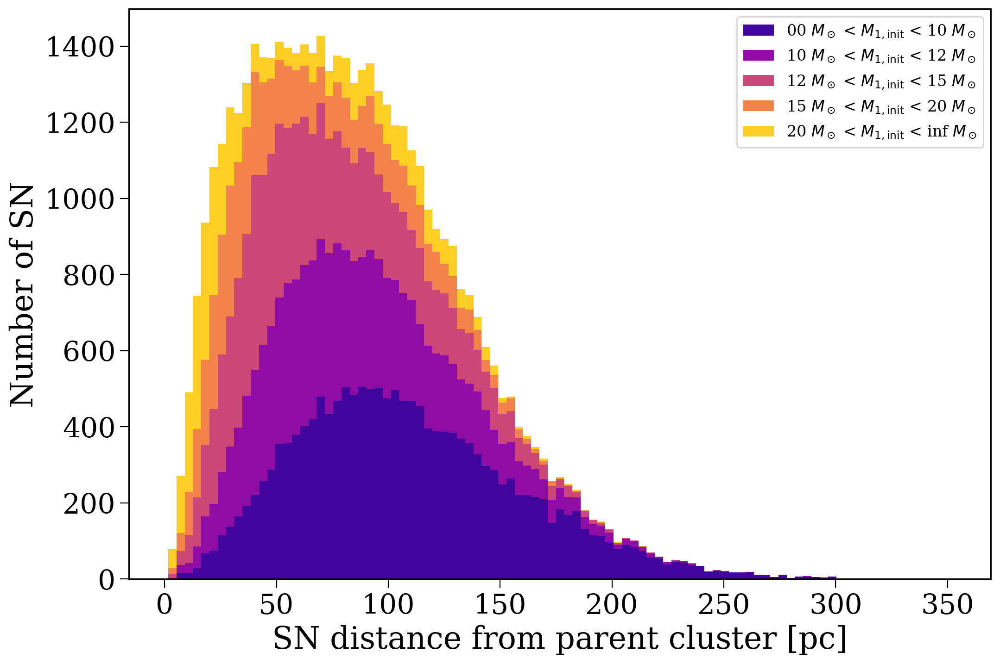

In [ ]:
mass_ranges = [(0, 10), (10, 12), (12, 15), (15, 20), (20, np.inf)]
mass_1_kicked = p.initC.loc[kicked_bin_nums]["mass_1"].values
sn_distances_hists = [sn_distances[(mass_1_kicked >= m_low) & (mass_1_kicked < m_high)].to(u.pc) for m_low, m_high in mass_ranges]

for x in sn_distances_hists:
    print(len(x))

labels = [f"{m_low:02d} $M_\odot$ < $M_{{1, \\rm init}}$ < {m_high} $M_\odot$" for m_low, m_high in mass_ranges]

plt.hist(sn_distances_hists, stacked=True, bins="fd", label=labels,
         color=plt.cm.plasma(np.linspace(0.1, 0.9, len(mass_ranges))));
plt.xlabel("SN distance from parent cluster [pc]")
plt.ylabel("Number of SN")
plt.legend(fontsize=0.5*fs)
plt.show()

Text(0, 0.5, 'Number of star particles')

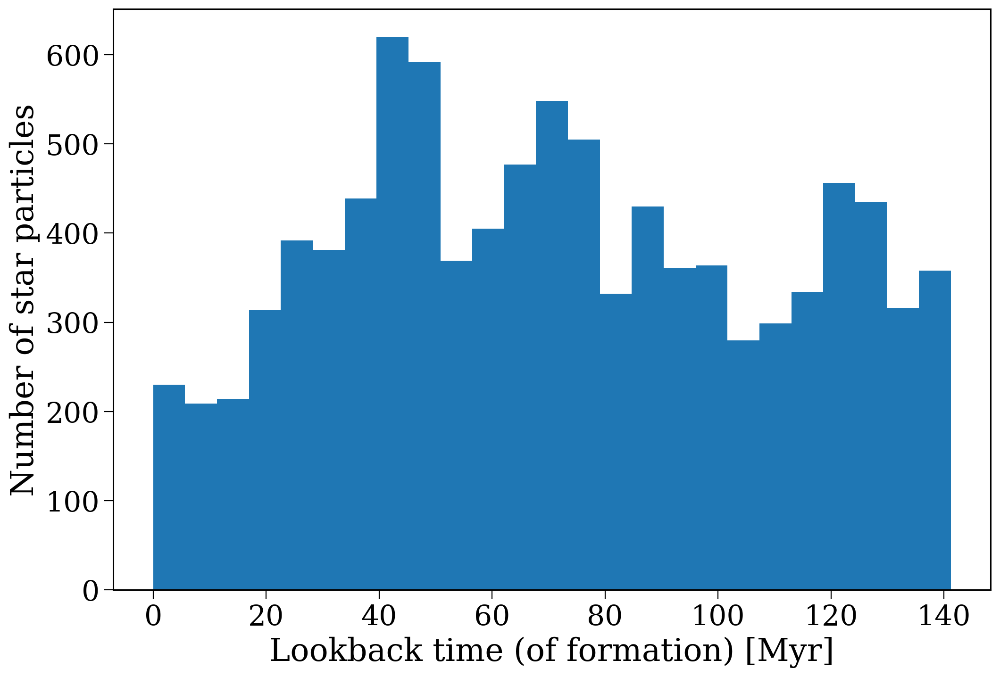

In [ ]:
plt.hist(-(star_particles["t_form"] - star_particles["t_form"].max()) * 1000, bins="fd");
plt.xlabel("Lookback time (of formation) [Myr]")
plt.ylabel("Number of star particles")

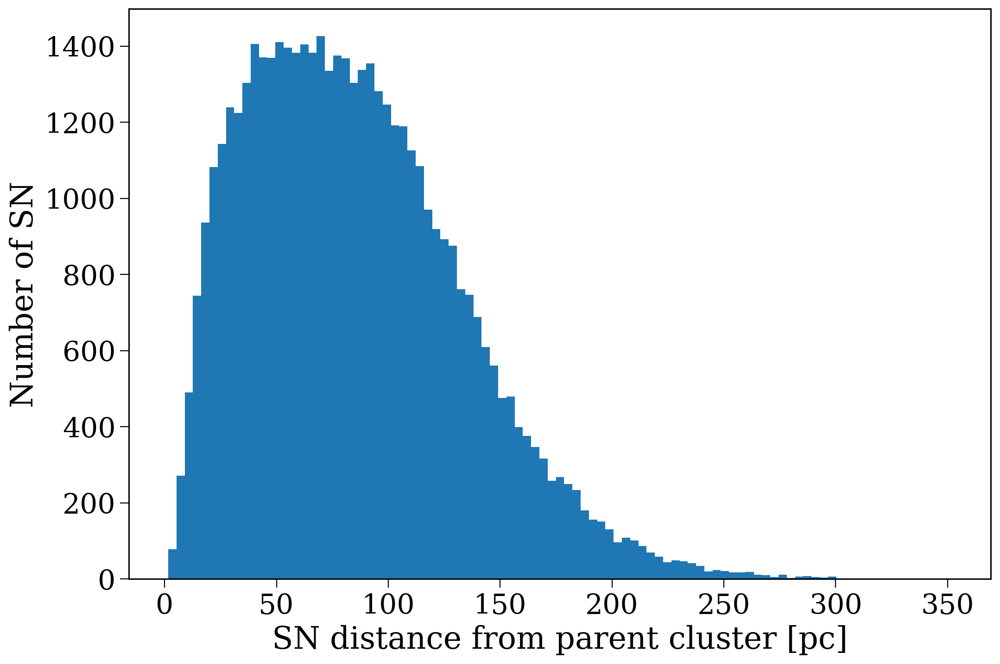

In [ ]:
plt.hist(sn_distances[sn_distances > 0 * u.kpc].to(u.pc), bins="fd");
plt.xlabel("SN distance from parent cluster [pc]")
plt.ylabel("Number of SN")
plt.show()

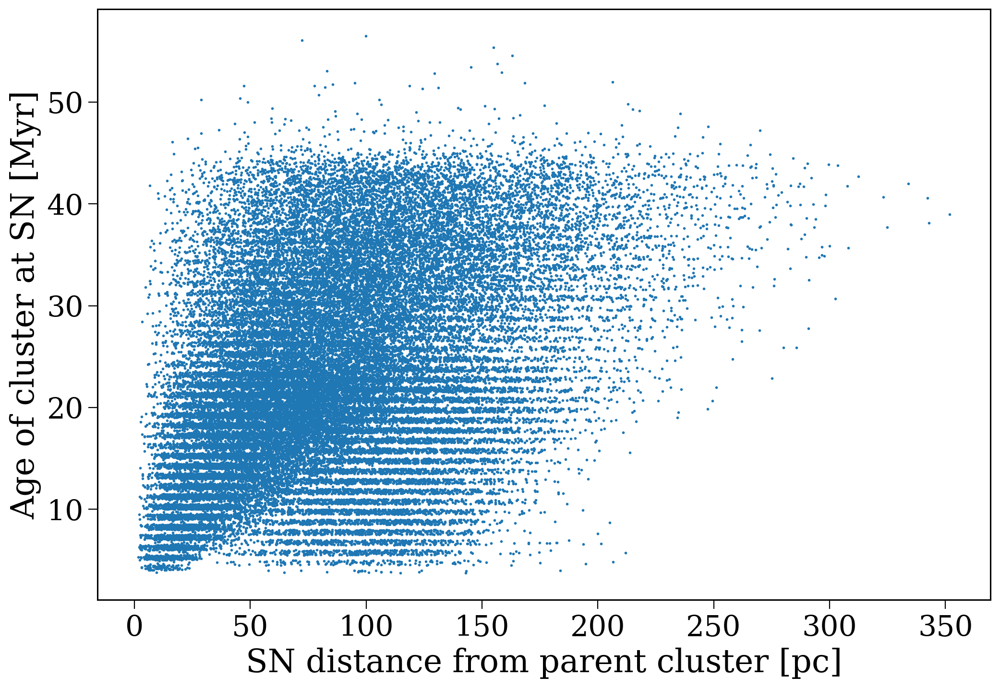

In [ ]:
plt.scatter(sn_distances.to(u.pc), sn_rows["tphys"].values, s=1);
plt.xlabel("SN distance from parent cluster [pc]")
plt.ylabel("Age of cluster at SN [Myr]")
plt.show()

# Demographics

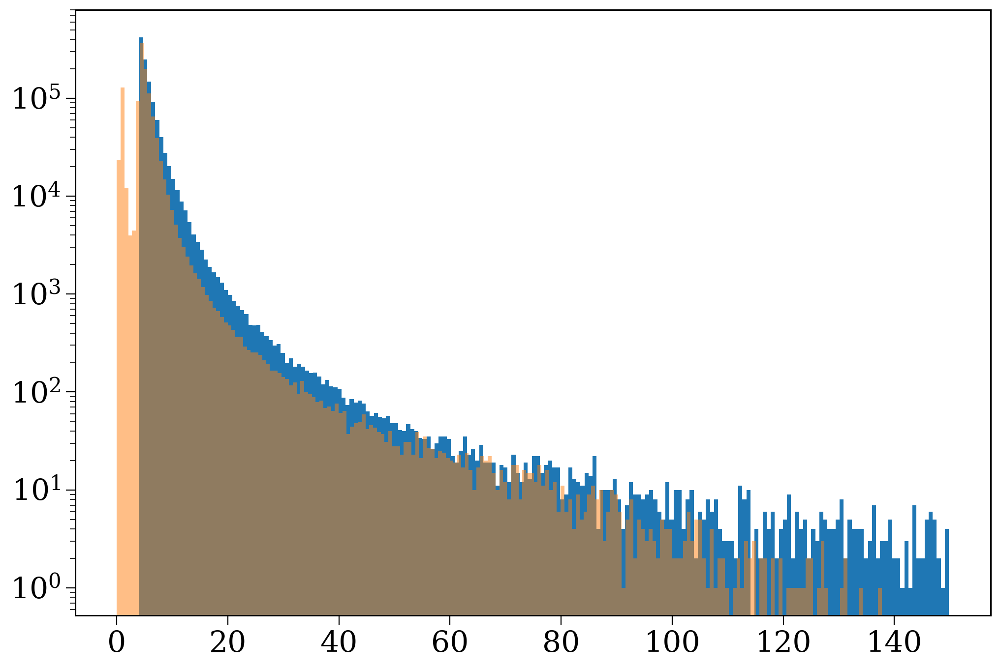

In [ ]:
plt.hist(p.initC["mass_1"], bins=200, log=True);
plt.hist(p.final_bpp["mass_1"], bins=200, log=True, alpha=0.5);